<h1 style="font-size: 38px; text-align: center; color: blue">The implementation of deep learning to develop an adequate tool for identifying the bumblebee species in Ireland</h1>

<br> </br>

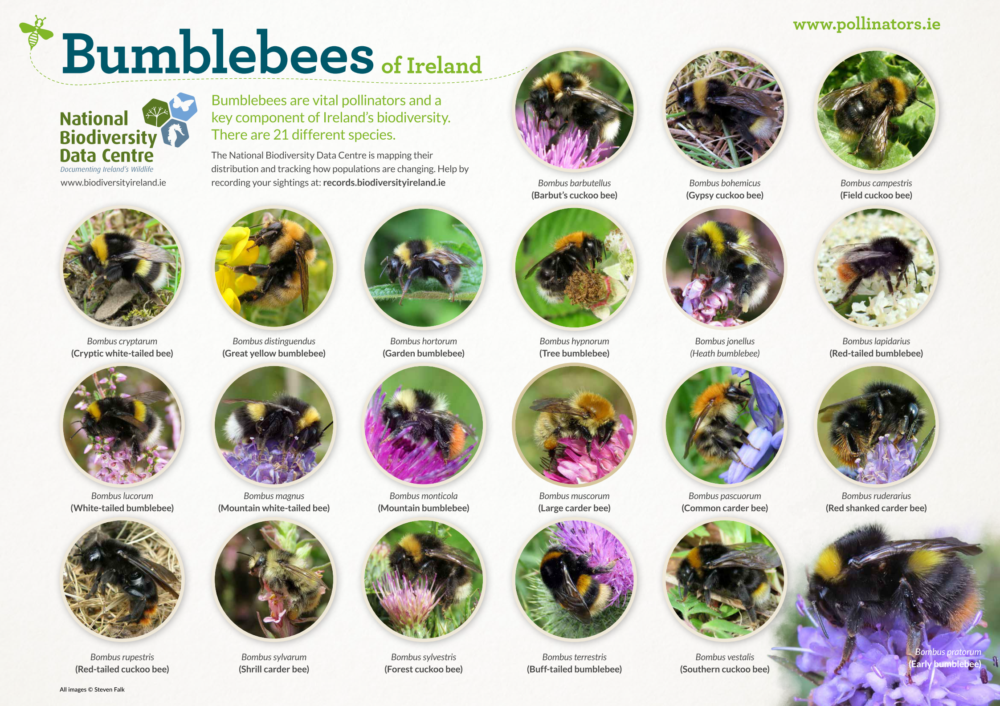

<br> </br>

In [1]:
# Import libraries
import os
import shutil
import random
import xml.etree.ElementTree as ET
import cv2

import warnings
warnings.filterwarnings("ignore")

# Import libraries
import pathlib
import itertools
import glob
import numpy as np

import PIL
from PIL import Image

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

<br> </br>

<h1 style="font-size: 28px; text-align: center; color: green"> 2. Deep Learning Models Training using Tensorflow and Keras</h1>

<br> </br>

In [2]:
import tensorflow as tf
from tensorflow import keras

from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.utils import Sequence
from tensorflow.keras import layers, models
from tensorflow.keras.models import Sequential, Model

from tensorflow.keras.layers import Input, Activation, Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.callbacks import LearningRateScheduler

from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

2023-12-04 23:52:02.311395: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-12-04 23:52:02.337818: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-04 23:52:02.337837: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-04 23:52:02.338504: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-04 23:52:02.342961: I tensorflow/core/platform/cpu_feature_guar

In [3]:
# Set data directory for training, validating and testing
training_data_dir = pathlib.Path('/home/hduser/Desktop/final dataset testing/machine learning/train/')
validate_data_dir = pathlib.Path('/home/hduser/Desktop/final dataset testing/machine learning/validate/')

print(training_data_dir)
print(validate_data_dir)

/home/hduser/Desktop/final dataset testing/machine learning/train
/home/hduser/Desktop/final dataset testing/machine learning/validate


<br> </br>
- **Check the image in the train folder**

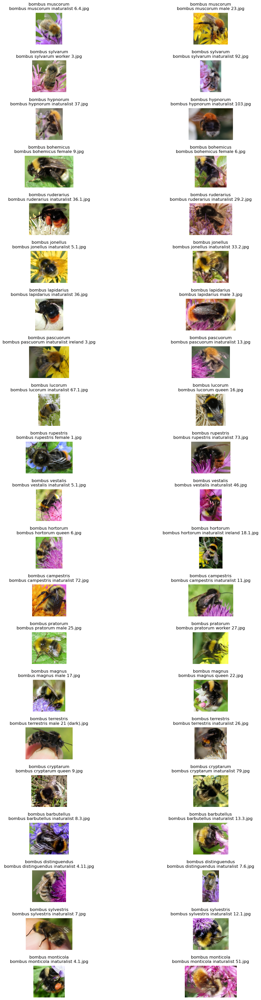

In [4]:
# Get the list of subdirectories (species)
species_list = [subdir.name for subdir in training_data_dir.glob('*')]

# Create a subplot grid
fig, axes = plt.subplots(21, 2, figsize=(15, 50))

# Adjust layout to provide space for titles
plt.subplots_adjust(hspace=0.5)

# Loop through each species
for i, species in enumerate(species_list):
    # Get two images from each species
    species_images = list(training_data_dir.glob(f'{species}/*'))[:2]

    # Loop through each image for the species
    for j, image_path in enumerate(species_images):
        image = Image.open(str(image_path))

        # Extract filename from path
        filename = os.path.basename(image_path)

        # Display the image on the subplot
        axes[i, j].imshow(image)
        axes[i, j].set_title(f'{species}\n{filename}', y=1.02)  # Adjust y position for title
        axes[i, j].axis('off')

plt.show()

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: orange"> Data Augmentation </h1>
<br> </br>

- <h1 style="font-size: 16px"> RandomPadding and Cropping; some popular geometric transformation methods, such as flipping and rotating; some affine methods </h1> </h1>
<br> </br>

In [5]:
def create_augmented_train_batches_keras(training_data_dir, img_height, img_width, model):
    batch_size = 32

    train_batches = ImageDataGenerator(preprocessing_function=model.preprocess_input) \
        .flow_from_directory(
            training_data_dir,
            class_mode='categorical',
            target_size=(img_height, img_width),
            batch_size=batch_size,
            shuffle=True,
            seed=42
        )

    random_padding_cropping = ImageDataGenerator(
        preprocessing_function=model.preprocess_input,
        width_shift_range=0.25,
        height_shift_range=0.25,
        fill_mode='constant',
        cval=0
    )

    padded_train_batches = random_padding_cropping.flow_from_directory(
        training_data_dir,
        target_size=(img_height, img_width),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=True,
        seed=42
    )

    random_geometric_transformation = ImageDataGenerator(
        preprocessing_function=model.preprocess_input,
        horizontal_flip=True,
        vertical_flip=True,
        zoom_range=0.4,
        brightness_range=(0.85, 0.98)
    )

    geometric_train_batches = random_geometric_transformation.flow_from_directory(
        training_data_dir,
        target_size=(img_height, img_width),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=True,
        seed=42
    )

    random_affine_transformation = ImageDataGenerator(
        preprocessing_function=model.preprocess_input,
        rotation_range=35,
        shear_range=0.2,
        channel_shift_range=0.2
    )

    affine_train_batches = random_affine_transformation.flow_from_directory(
        training_data_dir,
        target_size=(img_height, img_width),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=True,
        seed=42
    )

    class ConcatenateGenerators(Sequence):
        def __init__(self, *generators):
            self.generators = generators
            self.batch_size = min(gen.batch_size for gen in generators)
            self.n = sum(len(gen) * self.batch_size for gen in generators)

        def __len__(self):
            return self.n // self.batch_size

        def __getitem__(self, index):
            for gen in self.generators:
                if index < len(gen) * self.batch_size:
                    return gen[index % len(gen)]

                index -= len(gen) * self.batch_size

    train_batches_combined = ConcatenateGenerators(train_batches, padded_train_batches,
                                                   geometric_train_batches, affine_train_batches)

    # Return all batches
    return train_batches, padded_train_batches, geometric_train_batches, affine_train_batches, train_batches_combined

In [6]:
# function for plotting augmented images
def plotImages(images_arr):
    fig, axes = plt.subplots(2, 5, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 2.1 InceptionV3 </h1>
<br> </br>

In [7]:
inception_model = tf.keras.applications.inception_v3
img_height_inception, img_width_inception = (299, 299)
train_batches_inception, padded_train_batches_inception, \
geometric_train_batches_inception, affine_train_batches_inception, \
inception_train_batches = create_augmented_train_batches_keras(
    training_data_dir,
    img_height_inception,
    img_width_inception,
    inception_model
)

Found 3024 images belonging to 21 classes.
Found 3024 images belonging to 21 classes.
Found 3024 images belonging to 21 classes.
Found 3024 images belonging to 21 classes.


In [8]:
print(len(inception_train_batches))

380


In [9]:
print(inception_train_batches.n)

12160


In [10]:
# Specify image size and batch size
img_height_inception, img_width_inception = (299, 299)
batch_size = 32

In [11]:
validate_batches_inception = ImageDataGenerator(preprocessing_function=
                                                tf.keras.applications.inception_v3.preprocess_input) \
                    .flow_from_directory(validate_data_dir, 
                                         target_size=(img_height_inception, img_width_inception),
                                         batch_size=batch_size, 
                                         class_mode='categorical', 
                                         shuffle=True, 
                                         seed=42)

Found 756 images belonging to 21 classes.


In [12]:
print(len(train_batches_inception))
print(len(padded_train_batches_inception))
print(len(geometric_train_batches_inception))
print(len(affine_train_batches_inception))

95
95
95
95


In [13]:
print(type(train_batches_inception))
print(type(padded_train_batches_inception))
print(type(geometric_train_batches_inception))
print(type(affine_train_batches_inception))

<class 'keras.src.preprocessing.image.DirectoryIterator'>
<class 'keras.src.preprocessing.image.DirectoryIterator'>
<class 'keras.src.preprocessing.image.DirectoryIterator'>
<class 'keras.src.preprocessing.image.DirectoryIterator'>


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

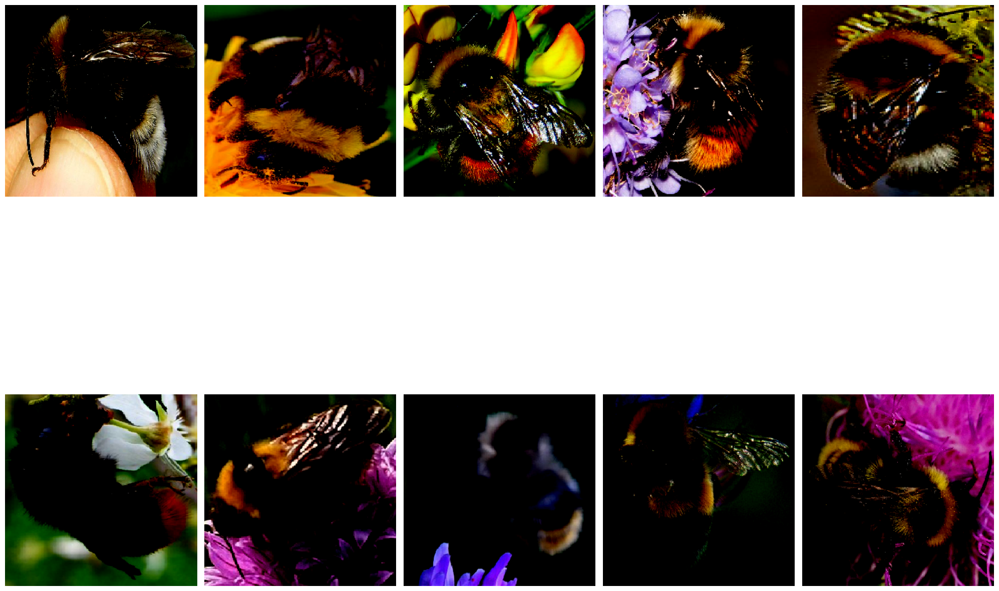

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [14]:
imgs, labels = next(train_batches_inception)

plotImages(imgs)
print(labels)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

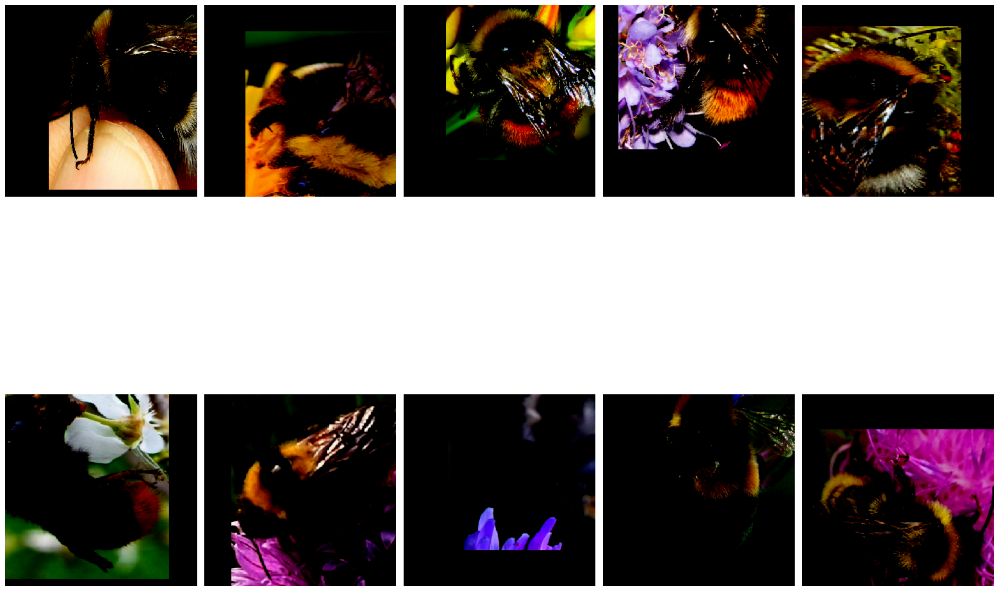

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [15]:
imgs, labels = next(padded_train_batches_inception)

plotImages(imgs)
print(labels)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

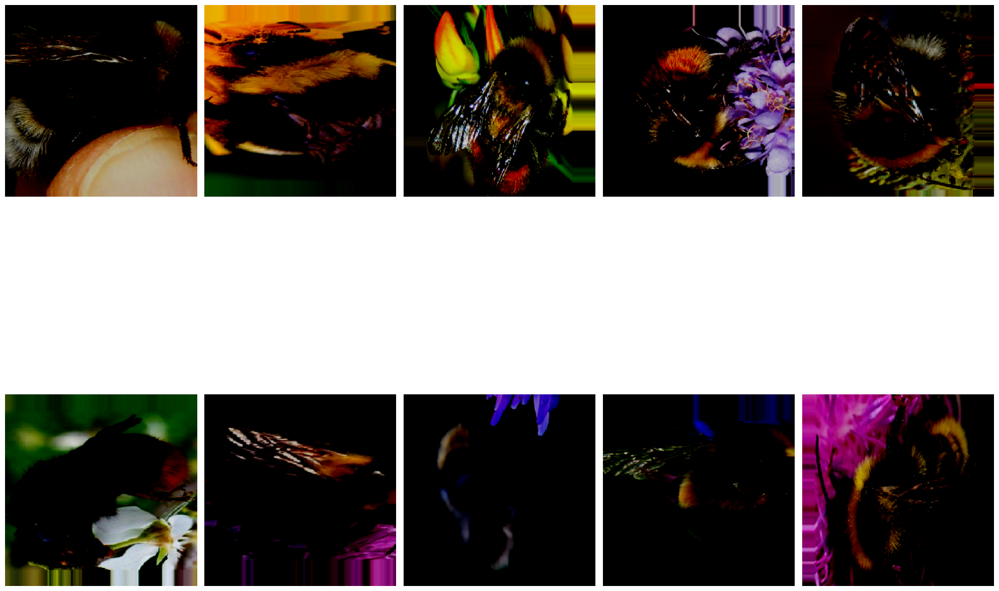

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [16]:
imgs, labels = next(geometric_train_batches_inception)

plotImages(imgs)
print(labels)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

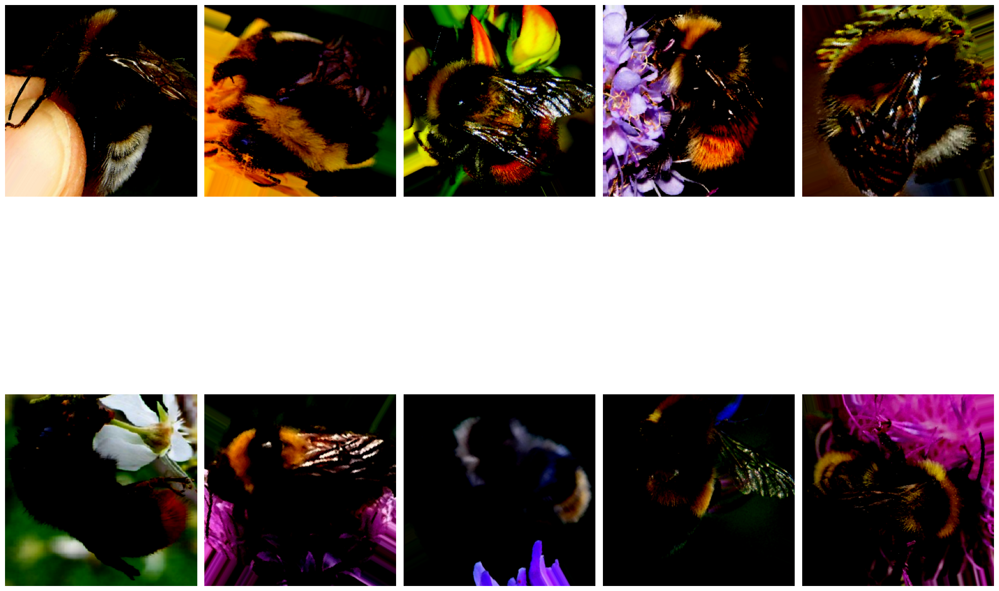

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [17]:
imgs, labels = next(affine_train_batches_inception)

plotImages(imgs)
print(labels)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

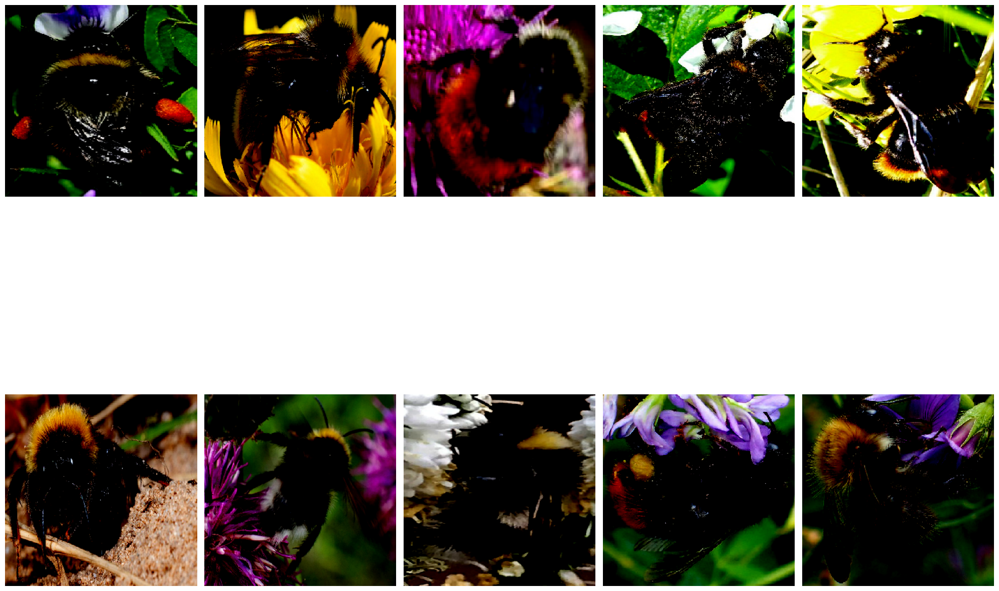

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [18]:
imgs, labels = next(validate_batches_inception)

plotImages(imgs)
print(labels)

In [19]:
inceptionv3 = tf.keras.applications.InceptionV3(
    include_top=False,
    input_shape=(299, 299, 3),
    pooling='avg',
    weights='imagenet')

for layer in inceptionv3.layers:
        layer.trainable=False

2023-12-04 23:52:08.772423: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:129] retrieving CUDA diagnostic information for host: alecfei-linuxlaptop
2023-12-04 23:52:08.772436: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:136] hostname: alecfei-linuxlaptop
2023-12-04 23:52:08.772515: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:159] libcuda reported version is: NOT_FOUND: was unable to find libcuda.so DSO loaded into this program
2023-12-04 23:52:08.772530: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:163] kernel reported version is: NOT_FOUND: could not find kernel module information in driver version file contents: "NVRM version: NVIDIA UNIX Open Kernel Module for x86_64  545.23.06  Release Build  (dvs-builder@U16-I3-C17-2-2)  Sun Oct 15 17:35:00 UTC 2023
GCC version:  gcc version 11.4.0 (Ubuntu 11.4.0-1ubuntu1~22.04) 
"


In [20]:
inceptionv3.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 149, 149, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 149, 149, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 149, 149, 32)         0         ['batch_normalizati

 conv2d_11 (Conv2D)          (None, 35, 35, 32)           6144      ['average_pooling2d[0][0]']   
                                                                                                  
 batch_normalization_5 (Bat  (None, 35, 35, 64)           192       ['conv2d_5[0][0]']            
 chNormalization)                                                                                 
                                                                                                  
 batch_normalization_7 (Bat  (None, 35, 35, 64)           192       ['conv2d_7[0][0]']            
 chNormalization)                                                                                 
                                                                                                  
 batch_normalization_10 (Ba  (None, 35, 35, 96)           288       ['conv2d_10[0][0]']           
 tchNormalization)                                                                                
          

                                                                                                  
 activation_17 (Activation)  (None, 35, 35, 96)           0         ['batch_normalization_17[0][0]
                                                                    ']                            
                                                                                                  
 activation_18 (Activation)  (None, 35, 35, 64)           0         ['batch_normalization_18[0][0]
                                                                    ']                            
                                                                                                  
 mixed1 (Concatenate)        (None, 35, 35, 288)          0         ['activation_12[0][0]',       
                                                                     'activation_14[0][0]',       
                                                                     'activation_17[0][0]',       
          

                                                                                                  
 conv2d_28 (Conv2D)          (None, 35, 35, 96)           55296     ['activation_27[0][0]']       
                                                                                                  
 batch_normalization_28 (Ba  (None, 35, 35, 96)           288       ['conv2d_28[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_28 (Activation)  (None, 35, 35, 96)           0         ['batch_normalization_28[0][0]
                                                                    ']                            
                                                                                                  
 conv2d_26 (Conv2D)          (None, 17, 17, 384)          995328    ['mixed2[0][0]']              
          

 conv2d_30 (Conv2D)          (None, 17, 17, 192)          147456    ['mixed3[0][0]']              
                                                                                                  
 conv2d_33 (Conv2D)          (None, 17, 17, 192)          172032    ['activation_32[0][0]']       
                                                                                                  
 conv2d_38 (Conv2D)          (None, 17, 17, 192)          172032    ['activation_37[0][0]']       
                                                                                                  
 conv2d_39 (Conv2D)          (None, 17, 17, 192)          147456    ['average_pooling2d_3[0][0]'] 
                                                                                                  
 batch_normalization_30 (Ba  (None, 17, 17, 192)          576       ['conv2d_30[0][0]']           
 tchNormalization)                                                                                
          

                                                                    ']                            
                                                                                                  
 average_pooling2d_4 (Avera  (None, 17, 17, 768)          0         ['mixed4[0][0]']              
 gePooling2D)                                                                                     
                                                                                                  
 conv2d_40 (Conv2D)          (None, 17, 17, 192)          147456    ['mixed4[0][0]']              
                                                                                                  
 conv2d_43 (Conv2D)          (None, 17, 17, 192)          215040    ['activation_42[0][0]']       
                                                                                                  
 conv2d_48 (Conv2D)          (None, 17, 17, 192)          215040    ['activation_47[0][0]']       
          

                                                                                                  
 activation_52 (Activation)  (None, 17, 17, 160)          0         ['batch_normalization_52[0][0]
                                                                    ']                            
                                                                                                  
 activation_57 (Activation)  (None, 17, 17, 160)          0         ['batch_normalization_57[0][0]
                                                                    ']                            
                                                                                                  
 average_pooling2d_5 (Avera  (None, 17, 17, 768)          0         ['mixed5[0][0]']              
 gePooling2D)                                                                                     
                                                                                                  
 conv2d_50

 batch_normalization_62 (Ba  (None, 17, 17, 192)          576       ['conv2d_62[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 batch_normalization_67 (Ba  (None, 17, 17, 192)          576       ['conv2d_67[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_62 (Activation)  (None, 17, 17, 192)          0         ['batch_normalization_62[0][0]
                                                                    ']                            
                                                                                                  
 activation_67 (Activation)  (None, 17, 17, 192)          0         ['batch_normalization_67[0][0]
          

                                                                                                  
 conv2d_71 (Conv2D)          (None, 8, 8, 320)            552960    ['activation_70[0][0]']       
                                                                                                  
 conv2d_75 (Conv2D)          (None, 8, 8, 192)            331776    ['activation_74[0][0]']       
                                                                                                  
 batch_normalization_71 (Ba  (None, 8, 8, 320)            960       ['conv2d_71[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 batch_normalization_75 (Ba  (None, 8, 8, 192)            576       ['conv2d_75[0][0]']           
 tchNormalization)                                                                                
          

                                                                                                  
 activation_82 (Activation)  (None, 8, 8, 384)            0         ['batch_normalization_82[0][0]
                                                                    ']                            
                                                                                                  
 activation_83 (Activation)  (None, 8, 8, 384)            0         ['batch_normalization_83[0][0]
                                                                    ']                            
                                                                                                  
 batch_normalization_84 (Ba  (None, 8, 8, 192)            576       ['conv2d_84[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activatio

                                                                                                  
 activation_88 (Activation)  (None, 8, 8, 384)            0         ['batch_normalization_88[0][0]
                                                                    ']                            
                                                                                                  
 activation_91 (Activation)  (None, 8, 8, 384)            0         ['batch_normalization_91[0][0]
                                                                    ']                            
                                                                                                  
 activation_92 (Activation)  (None, 8, 8, 384)            0         ['batch_normalization_92[0][0]
                                                                    ']                            
                                                                                                  
 batch_nor

In [21]:
model_inceptionv3 = Sequential()

model_inceptionv3.add(inceptionv3)
model_inceptionv3.add(Flatten())
model_inceptionv3.add(Dense(512, activation='relu'))
model_inceptionv3.add(Dropout(0.2))
model_inceptionv3.add(Dense(21, activation='softmax'))

In [22]:
model_inceptionv3.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 2048)              21802784  
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 512)               1049088   
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 21)                10773     
                                                                 
Total params: 22862645 (87.21 MB)
Trainable params: 1059861 (4.04 MB)
Non-trainable params: 21802784 (83.17 MB)
_________________________________________________________________


In [23]:
model_inceptionv3.compile(optimizer=Adam(learning_rate=0.001),
                          loss='categorical_crossentropy',
                          metrics=['accuracy'])

<br> </br>

In [24]:
# Define a learning rate decay function
def lr_decay(epoch, lr):
    decay_factor = 0.8
    decay_step = 3
    return lr * decay_factor**(epoch // decay_step)

# Create a learning rate scheduler for all models
lr_scheduler = LearningRateScheduler(lr_decay, verbose=1)

<br> </br>

In [ ]:
# Train the model with the learning rate scheduler callback
epoch_inceptionv3 = 30

result_inceptionv3 = model_inceptionv3.fit(inception_train_batches,
                                           validation_data=validate_batches_inception,
                                           epochs=epoch_inceptionv3,
                                           callbacks=[lr_scheduler],
                                           verbose=2)


Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/30
380/380 - 243s - loss: 2.3411 - accuracy: 0.2898 - val_loss: 2.0607 - val_accuracy: 0.3307 - lr: 0.0010 - 243s/epoch - 640ms/step

Epoch 2: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 2/30
380/380 - 244s - loss: 1.6316 - accuracy: 0.4945 - val_loss: 1.9470 - val_accuracy: 0.3810 - lr: 0.0010 - 244s/epoch - 642ms/step

Epoch 3: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 3/30
380/380 - 245s - loss: 1.2606 - accuracy: 0.6068 - val_loss: 1.8595 - val_accuracy: 0.4114 - lr: 0.0010 - 245s/epoch - 644ms/step

Epoch 4: LearningRateScheduler setting learning rate to 0.000800000037997961.
Epoch 4/30
380/380 - 251s - loss: 0.9869 - accuracy: 0.6973 - val_loss: 1.7821 - val_accuracy: 0.4339 - lr: 8.0000e-04 - 251s/epoch - 661ms/step

Epoch 5: LearningRateScheduler setting learning rate to 0.0006400000303983689.
Epoch 5/30
380/380 - 264s - loss:

<br> </br>
- <h1 style="font-size: 16px"> Create functions for plotting model training results in Keras. </h1>
<br> </br>

In [ ]:
# Create a function for plotting accuracy fluctuation

def plot_accuracy(epochs, history, model_name):
    plt.figure(figsize=(8, 8))
    
    epochs_range = range(1, epochs + 1)
    plt.plot(epochs_range, history['accuracy'], label="Training Accuracy", color='green')
    plt.plot(epochs_range, history['val_accuracy'], label="Validation Accuracy", color='blue', linestyle='--')
    
    plt.ylim(0, 1)
    plt.grid(True, alpha=0.7)
    
    plt.title(f'Train and Validation Accuracy of {model_name} Model')
    plt.ylabel('Accuracy')
    plt.xlabel('Epochs')
    plt.legend(['train', 'validation'])
    
    plt.show()

In [ ]:
# Create a function for plotting loss fluctuation

def plot_loss(epochs, history, model_name):
    plt.figure(figsize=(8, 8))
    
    epochs_range = range(1, epochs + 1)
    plt.plot(epochs_range, history['loss'], label="Training Loss", color='green')
    plt.plot(epochs_range, history['val_loss'], label="Validation Loss", color='blue', linestyle='--')

    plt.grid(True, alpha=0.7)
    
    plt.title(f'Train and Validation Loss of {model_name} Model')
    plt.ylabel('Loss')
    plt.xlabel('Epochs')
    plt.legend(['train', 'validation'])

    plt.show()

In [ ]:
# Create a function for plotting confusion matrix
def plot_confusion_matrix(model, batches, model_name):
    # Get the number of batches
    num_batches = len(batches)

    # Make predictions for each batch
    predictions = []
    true_labels = []

    for i in range(num_batches):
        # Get a batch of data
        batch_data, batch_labels = batches[i]

        # Make predictions for the batch
        batch_predictions = model.predict(batch_data)
        predictions.extend(np.argmax(batch_predictions, axis=1))
        
        # Extract true labels from the batch
        true_labels.extend(np.argmax(batch_labels, axis=1))

    # Convert lists to numpy arrays
    predicted_labels = np.array(predictions)
    true_labels = np.array(true_labels)

    # Get class names from the data generator
    class_names = list(batches.class_indices.keys())

    # Compute the confusion matrix
    cm = confusion_matrix(true_labels, predicted_labels)

    # Plot the confusion matrix using seaborn
    plt.figure(figsize=(14, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)

    # Loop to annotate each cell in the heatmap
    for i in range(len(class_names)):
        for j in range(len(class_names)):
            plt.text(j + 0.5, i + 0.5, str(cm[i, j]), ha='center', va='center',
                     bbox=dict(facecolor='white', edgecolor='white', boxstyle='round,pad=0.3'))

    plt.xticks(rotation=45)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(f'Confusion Matrix of {model_name} Model', fontsize=20)
    plt.show()

In [ ]:
# Create a function for plotting report overview

def plot_classification_report(model, batches, model_name):
    # Get the number of batches
    num_batches = len(batches)

    # Make predictions for each batch
    predictions = []
    true_labels = []

    for i in range(num_batches):
        # Get a batch of data
        batch_data, batch_labels = batches[i]

        # Make predictions for the batch
        batch_predictions = model.predict(batch_data)
        predictions.extend(np.argmax(batch_predictions, axis=1))
        
        # Extract true labels from the batch
        true_labels.extend(np.argmax(batch_labels, axis=1))

    # Convert lists to numpy arrays
    predicted_labels = np.array(predictions)
    true_labels = np.array(true_labels)

    # Get class names from the data generator
    class_names = list(batches.class_indices.keys())

    
    # Generate classification report dictionary
    report_dict = classification_report(true_labels, predicted_labels, 
                                        target_names=class_names, output_dict=True)

    # Extract metrics for each class
    precision = [report_dict[class_name]['precision'] for class_name in class_names]
    recall = [report_dict[class_name]['recall'] for class_name in class_names]
    f1_score = [report_dict[class_name]['f1-score'] for class_name in class_names]

    # Plotting using subplots
    fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(16, 18), sharex=True)

    # Plot precision
    axs[0].bar(class_names, precision, color='blue')
    axs[0].set_ylabel('Precision')
    axs[0].set_title('Precision by Class')
    axs[0].grid(True, alpha=0.5)

    # Plot recall
    axs[1].bar(class_names, recall, color='green')
    axs[1].set_ylabel('Recall')
    axs[1].set_title('Recall by Class')
    axs[1].grid(True, alpha=0.5)

    # Plot F1-score
    axs[2].bar(class_names, f1_score, color='orange')
    axs[2].set_xlabel('Class Names')
    axs[2].set_ylabel('F1-Score')
    axs[2].set_title('F1-Score by Class')
    axs[2].grid(True, alpha=0.5)

    # Adjust layout and rotate x-axis labels
    plt.tight_layout(pad=7.0)
    plt.xticks(rotation=45, ha='right')
    
    # Add a title on top
    plt.suptitle(f'Classification Report Overview of {model_name} Model', fontsize=20)

    plt.show()

In [ ]:
# Create a function for printing classification report

def print_classification_report(model, batches, model_name):
   # Get the number of batches
    num_batches = len(batches)

    # Make predictions for each batch
    predictions = []
    true_labels = []

    for i in range(num_batches):
        # Get a batch of data
        batch_data, batch_labels = batches[i]

        # Make predictions for the batch
        batch_predictions = model.predict(batch_data)
        predictions.extend(np.argmax(batch_predictions, axis=1))
        
        # Extract true labels from the batch
        true_labels.extend(np.argmax(batch_labels, axis=1))

    # Convert lists to numpy arrays
    predicted_labels = np.array(predictions)
    true_labels = np.array(true_labels)

    # Get class names from the data generator
    class_names = list(batches.class_indices.keys())

    # Generate classification report
    report = classification_report(true_labels, predicted_labels, target_names=class_names)
    
    print(f"Classification Report of {model_name} Model:\n", report)

In [ ]:
# Create a function for plotting ROC curves

def plot_roc_curves(model, batches, model_name):
    # Get the number of batches
    num_batches = len(batches)

    # Make predictions for each batch
    predictions = []
    true_labels = []

    for i in range(num_batches):
        # Get a batch of data
        batch_data, batch_labels = batches[i]

        # Make predictions for the batch
        batch_predictions = model.predict(batch_data)
        predictions.extend(batch_predictions)
        
        # Extract true labels from the batch
        true_labels.extend(batch_labels)

    # Convert lists to numpy arrays
    predicted_labels = np.array(predictions)
    true_labels = np.array(true_labels)

    # Get class names from the data generator
    class_names = list(batches.class_indices.keys())

    plt.figure(figsize=(14, 10))

    for class_index in range(len(class_names)):
        # Binarize true labels for the current class
        true_labels_bin = label_binarize(true_labels[:, class_index], classes=[0, 1])

        # Compute ROC curve and AUC
        fpr, tpr, _ = roc_curve(true_labels_bin, predicted_labels[:, class_index])
        auc_score = auc(fpr, tpr)

        label = f'{class_names[class_index]} (AUC = {auc_score:.2f})'
        plt.plot(fpr, tpr, label=label)

    plt.xlabel('False Positive Rate (Specificity)')
    plt.ylabel('True Positive Rate (Sensitivity)')
    
    plt.title(f'ROC Curves of {model_name} Model', fontsize=16)
    plt.grid(True, alpha=0.5)
    plt.legend(loc='lower right', bbox_to_anchor=(1, 0), ncol=2, title="species names")

    plt.show()

<br> </br>

In [ ]:
plot_accuracy(epoch_inceptionv3, result_inceptionv3.history, 'InceptionV3')

In [ ]:
plot_loss(epoch_inceptionv3, result_inceptionv3.history, 'InceptionV3')

In [ ]:
plot_confusion_matrix(model_inceptionv3, validate_batches_inception, 'InceptionV3')

In [ ]:
plot_classification_report(model_inceptionv3, validate_batches_inception, 'InceptionV3')

In [ ]:
print_classification_report(model_inceptionv3, validate_batches_inception, 'InceptionV3')

In [ ]:
plot_roc_curves(model_inceptionv3, validate_batches_inception, 'InceptionV3')

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 2.2 ResNet101 </h1>
<br> </br>

In [ ]:
resnet_model = tf.keras.applications.resnet
img_height_resnet, img_width_resnet = (224, 224)
train_batches_resnet, padded_train_batches_resnet, \
geometric_train_batches_resnet, affine_train_batches_resnet, \
resnet_train_batches = create_augmented_train_batches_keras(
    training_data_dir,
    img_height_resnet, 
    img_width_resnet, 
    resnet_model
)

In [ ]:
print(len(resnet_train_batches))

In [ ]:
print(resnet_train_batches.n)

In [ ]:
# Specify image size and batch size
img_height_resnet, img_width_resnet = (224, 224)
batch_size = 32

In [ ]:
validate_batches_resnet = ImageDataGenerator(preprocessing_function=
                                            tf.keras.applications.resnet.preprocess_input) \
                    .flow_from_directory(validate_data_dir, 
                                         target_size=(img_height_resnet, img_width_resnet),
                                         batch_size=batch_size, 
                                         class_mode='categorical', 
                                         shuffle=True, 
                                         seed=42)

In [ ]:
print(len(train_batches_resnet))
print(len(padded_train_batches_resnet))
print(len(geometric_train_batches_resnet))
print(len(affine_train_batches_resnet))

In [ ]:
print(type(train_batches_resnet))
print(type(padded_train_batches_resnet))
print(type(geometric_train_batches_resnet))
print(type(affine_train_batches_resnet))

In [ ]:
imgs, labels = next(train_batches_resnet)

plotImages(imgs)
print(labels)

In [ ]:
imgs, labels = next(padded_train_batches_resnet)

plotImages(imgs)
print(labels)

In [ ]:
imgs, labels = next(geometric_train_batches_resnet)

plotImages(imgs)
print(labels)

In [ ]:
imgs, labels = next(affine_train_batches_resnet)

plotImages(imgs)
print(labels)

In [ ]:
imgs, labels = next(validate_batches_resnet)

plotImages(imgs)
print(labels)

In [ ]:
resnet101 = tf.keras.applications.ResNet101(
    include_top=False,
    input_shape=(224, 224, 3),
    pooling='avg',
    weights='imagenet')

for layer in resnet101.layers:
        layer.trainable=False

In [ ]:
resnet101.summary()

In [ ]:
model_resnet101 = Sequential()

model_resnet101.add(resnet101)
model_resnet101.add(Flatten())
model_resnet101.add(Dense(512, activation='relu'))
model_resnet101.add(Dropout(0.2))
model_resnet101.add(Dense(21, activation='softmax'))

In [ ]:
model_resnet101.summary()

In [ ]:
model_resnet101.compile(optimizer=Adam(learning_rate=0.001),
                        loss='categorical_crossentropy',
                        metrics=['accuracy'])

In [ ]:
epoch_resnet101 = 30

result_resnet101 = model_resnet101.fit(resnet_train_batches,
                                       validation_data=validate_batches_resnet,
                                       epochs=epoch_resnet101,
                                       callbacks=[lr_scheduler],
                                       verbose=2)

In [ ]:
plot_accuracy(epoch_resnet101, result_resnet101.history, 'ResNet101')

In [ ]:
plot_loss(epoch_resnet101, result_resnet101.history, 'ResNet101')

In [ ]:
plot_confusion_matrix(model_resnet101, validate_batches_resnet, 'ResNet101')

In [ ]:
plot_classification_report(model_resnet101, validate_batches_resnet, 'ResNet101')

In [ ]:
print_classification_report(model_resnet101, validate_batches_resnet, 'ResNet101')

In [ ]:
plot_roc_curves(model_resnet101, validate_batches_resnet, 'ResNet101')

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 2.3 VGG19 </h1>
<br> </br>

In [ ]:
vgg_model = tf.keras.applications.vgg19
img_height_vgg, img_width_vgg = (224, 224)
train_batches_vgg, padded_train_batches_vgg, \
geometric_train_batches_vgg, affine_train_batches_vgg, \
vgg_train_batches = create_augmented_train_batches_keras(
    training_data_dir,
    img_height_vgg,
    img_width_vgg,
    vgg_model
)

In [ ]:
print(len(vgg_train_batches))

In [ ]:
print(vgg_train_batches.n)

In [ ]:
# Specify image size and batch size
img_height_vgg, img_width_vgg = (224, 224)
batch_size = 32

In [ ]:
validate_batches_vgg = ImageDataGenerator(preprocessing_function=
                                          tf.keras.applications.vgg19.preprocess_input) \
                    .flow_from_directory(validate_data_dir, 
                                         target_size=(img_height_vgg, img_width_vgg),
                                         batch_size=batch_size, 
                                         class_mode='categorical', 
                                         shuffle=True, 
                                         seed=42)

In [ ]:
print(len(train_batches_vgg))
print(len(padded_train_batches_vgg))
print(len(geometric_train_batches_vgg))
print(len(affine_train_batches_vgg))

In [ ]:
print(type(train_batches_vgg))
print(type(padded_train_batches_vgg))
print(type(geometric_train_batches_vgg))
print(type(affine_train_batches_vgg))

In [ ]:
imgs, labels = next(train_batches_vgg)

plotImages(imgs)
print(labels)

In [ ]:
imgs, labels = next(padded_train_batches_vgg)

plotImages(imgs)
print(labels)

In [ ]:
imgs, labels = next(geometric_train_batches_vgg)

plotImages(imgs)
print(labels)

In [ ]:
imgs, labels = next(affine_train_batches_vgg)

plotImages(imgs)
print(labels)

In [ ]:
imgs, labels = next(validate_batches_vgg)

plotImages(imgs)
print(labels)

In [ ]:
vgg19 = tf.keras.applications.VGG19(
    include_top=False,
    input_shape=(224, 224, 3),
    pooling='avg',
    weights='imagenet')

for layer in vgg19.layers:
        layer.trainable=False

In [ ]:
vgg19.summary()

In [ ]:
model_vgg19 = Sequential()

model_vgg19.add(vgg19)
model_vgg19.add(Flatten())
model_vgg19.add(Dense(512, activation='relu'))
model_vgg19.add(Dropout(0.2))
model_vgg19.add(Dense(21, activation='softmax'))

In [ ]:
model_vgg19.summary()

In [ ]:
model_vgg19.compile(optimizer=Adam(learning_rate=0.001),
                    loss='categorical_crossentropy',
                    metrics=['accuracy'])

In [ ]:
epoch_vgg19 = 30

result_vgg19 = model_vgg19.fit(vgg_train_batches,
                               validation_data=validate_batches_vgg,
                               epochs=epoch_vgg19,
                               callbacks=[lr_scheduler],
                               verbose=2)

In [ ]:
plot_accuracy(epoch_vgg19, result_vgg19.history, 'VGG19')

In [ ]:
plot_loss(epoch_vgg19, result_vgg19.history, 'VGG19')

In [ ]:
plot_confusion_matrix(model_vgg19, validate_batches_vgg, 'VGG19')

In [ ]:
plot_classification_report(model_vgg19, validate_batches_vgg, 'VGG19')

In [ ]:
print_classification_report(model_vgg19, validate_batches_vgg, 'VGG19')

In [ ]:
plot_roc_curves(model_vgg19, validate_batches_vgg, 'VGG19')

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 2.4 MobileNetV3Large </h1>
<br> </br>

In [ ]:
mobilenet_model = tf.keras.applications.mobilenet_v3
img_height_mobilenet, img_width_mobilenet = (224, 224)
train_batches_mobilenet, padded_train_batches_mobilenet, \
geometric_train_batches_mobilenet, affine_train_batches_mobilenet, \
mobilenet_train_batches = create_augmented_train_batches_keras(
    training_data_dir,
    img_height_mobilenet,
    img_width_mobilenet,
    mobilenet_model
)

In [ ]:
print(len(mobilenet_train_batches))

In [ ]:
print(mobilenet_train_batches.n)

In [ ]:
# Specify image size and batch size
img_height_mobilenet, img_width_mobilenet = (224, 224)
batch_size = 32

In [ ]:
validate_batches_mobilenet = ImageDataGenerator(preprocessing_function=
                             tf.keras.applications.mobilenet_v3.preprocess_input) \
                    .flow_from_directory(validate_data_dir, 
                                         target_size=(img_height_mobilenet, img_width_mobilenet),
                                         batch_size=batch_size, 
                                         class_mode='categorical', 
                                         shuffle=True, 
                                         seed=42)

In [ ]:
print(len(train_batches_mobilenet))
print(len(padded_train_batches_mobilenet))
print(len(geometric_train_batches_mobilenet))
print(len(affine_train_batches_mobilenet))

In [ ]:
print(type(train_batches_mobilenet))
print(type(padded_train_batches_mobilenet))
print(type(geometric_train_batches_mobilenet))
print(type(affine_train_batches_mobilenet))

In [ ]:
imgs, labels = next(train_batches_mobilenet)

plotImages(imgs)
print(labels)

In [ ]:
imgs, labels = next(padded_train_batches_mobilenet)

plotImages(imgs)
print(labels)

In [ ]:
imgs, labels = next(geometric_train_batches_mobilenet)

plotImages(imgs)
print(labels)

In [ ]:
imgs, labels = next(affine_train_batches_mobilenet)

plotImages(imgs)
print(labels)

In [ ]:
imgs, labels = next(validate_batches_mobilenet)

plotImages(imgs)
print(labels)

In [ ]:
mobilenetv3 = tf.keras.applications.MobileNetV3Large(
    include_top=False,
    input_shape=(224, 224, 3),
    pooling='avg',
    weights='imagenet')

for layer in mobilenetv3.layers:
        layer.trainable=False

In [ ]:
mobilenetv3.summary()

In [ ]:
model_mobilenetv3 = Sequential()

model_mobilenetv3.add(mobilenetv3)
model_mobilenetv3.add(Flatten())
model_mobilenetv3.add(Dense(512, activation='relu'))
model_mobilenetv3.add(Dropout(0.2))
model_mobilenetv3.add(Dense(21, activation='softmax'))

In [ ]:
model_mobilenetv3.summary()

In [ ]:
model_mobilenetv3.compile(optimizer=Adam(learning_rate=0.001),
                          loss='categorical_crossentropy',
                          metrics=['accuracy'])

In [ ]:
epoch_mobilenetv3 = 30

result_mobilenetv3 = model_mobilenetv3.fit(mobilenet_train_batches,
                                           validation_data=validate_batches_mobilenet,
                                           epochs=epoch_mobilenetv3,
                                           callbacks=[lr_scheduler],
                                           verbose=2)

In [ ]:
plot_accuracy(epoch_mobilenetv3, result_mobilenetv3.history, 'MobileNetV3 Large')

In [ ]:
plot_loss(epoch_mobilenetv3, result_mobilenetv3.history, 'MobileNetV3 Large')

In [ ]:
plot_confusion_matrix(model_mobilenetv3, validate_batches_mobilenet, 'MobileNetV3 Large')

In [ ]:
plot_classification_report(model_mobilenetv3, validate_batches_mobilenet, 'MobileNetV3 Large')

In [ ]:
print_classification_report(model_mobilenetv3, validate_batches_mobilenet, 'MobileNetV3 Large')

In [ ]:
plot_roc_curves(model_mobilenetv3, validate_batches_mobilenet, 'MobileNetV3 Large')

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 2.5 EfficientNetV2 Large </h1>
<br> </br>

In [ ]:
efficientnet_model = tf.keras.applications.efficientnet_v2
img_height_efficientnet, img_width_efficientnet = (240, 240)
train_batches_efficientnet, padded_train_batches_efficientnet, \
geometric_train_batches_efficientnet, affine_train_batches_efficientnet, \
efficientnet_train_batches = create_augmented_train_batches_keras(
    training_data_dir,
    img_height_efficientnet,
    img_width_efficientnet,
    efficientnet_model
)

In [ ]:
print(len(efficientnet_train_batches))

In [ ]:
print(efficientnet_train_batches.n)

In [ ]:
# Specify image size and batch size
img_height_efficientnet, img_width_efficientnet = (240, 240)
batch_size = 32

In [ ]:
validate_batches_efficientnet = ImageDataGenerator(preprocessing_function=
                                tf.keras.applications.efficientnet_v2.preprocess_input) \
                    .flow_from_directory(validate_data_dir, 
                                         target_size=(img_height_efficientnet, img_width_efficientnet),
                                         batch_size=batch_size, 
                                         class_mode='categorical', 
                                         shuffle=True, 
                                         seed=42)

In [ ]:
print(len(train_batches_efficientnet))
print(len(padded_train_batches_efficientnet))
print(len(geometric_train_batches_efficientnet))
print(len(affine_train_batches_efficientnet))

In [ ]:
print(type(train_batches_efficientnet))
print(type(padded_train_batches_efficientnet))
print(type(geometric_train_batches_efficientnet))
print(type(affine_train_batches_efficientnet))

In [ ]:
imgs, labels = next(train_batches_efficientnet)

plotImages(imgs)
print(labels)

In [ ]:
imgs, labels = next(padded_train_batches_efficientnet)

plotImages(imgs)
print(labels)

In [ ]:
imgs, labels = next(geometric_train_batches_efficientnet)

plotImages(imgs)
print(labels)

In [ ]:
imgs, labels = next(affine_train_batches_efficientnet)

plotImages(imgs)
print(labels)

In [ ]:
imgs, labels = next(validate_batches_efficientnet)

plotImages(imgs)
print(labels)

In [ ]:
efficientnetv2 = tf.keras.applications.EfficientNetV2L(
    include_top=False,
    input_shape=(480, 480, 3),
    pooling='avg',
    weights='imagenet')

for layer in efficientnetv2.layers:
        layer.trainable=False

In [ ]:
efficientnetv2.summary()

In [ ]:
model_efficientnetv2 = Sequential()

model_efficientnetv2.add(efficientnetv2)
model_efficientnetv2.add(Flatten())
model_efficientnetv2.add(Dense(512, activation='relu'))
model_efficientnetv2.add(Dropout(0.2))
model_efficientnetv2.add(Dense(21, activation='softmax'))

In [ ]:
model_efficientnetv2.summary()

In [ ]:
model_efficientnetv2.compile(optimizer=Adam(learning_rate=0.001),
                             loss='categorical_crossentropy',
                             metrics=['accuracy'])

In [ ]:
epoch_efficientnetv2 = 30

result_efficientnetv2 = model_efficientnetv2.fit(efficientnet_train_batches,
                                                 validation_data=validate_batches_efficientnet,
                                                 epochs=epoch_efficientnetv2,
                                                 callbacks=[lr_scheduler],
                                                 verbose=2)

In [ ]:
plot_accuracy(epoch_efficientnetv2, result_efficientnetv2.history, 'EfficientNetV2_Large')

In [ ]:
plot_loss(epoch_efficientnetv2, result_efficientnetv2.history, 'EfficientNetV2_Large')

In [ ]:
plot_confusion_matrix(model_efficientnetv2, validate_batches_efficientnet, 'EfficientNetV2 Large')

In [ ]:
plot_classification_report(model_efficientnetv2, validate_batches_efficientnet, 'EfficientNetV2 Large')

In [ ]:
print_classification_report(model_efficientnetv2, validate_batches_efficientnet, 'EfficientNetV2 Large')

In [ ]:
plot_roc_curves(model_efficientnetv2, validate_batches_efficientnet, 'EfficientNetV2 Large')